# G211.59
Trey V. Wenger - March 2025

In [1]:
# General imports    
import os
import pickle
import time

import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import numpy as np
import pymc as pm

print("arviz version:", az.__version__)

print("pymc version:", pm.__version__)

import bayes_spec
print("bayes_spec version:", bayes_spec.__version__)

import bayes_cn_hfs
print("bayes_cn_hfs version:", bayes_cn_hfs.__version__)

# Notebook configuration
pd.options.display.max_rows = None

arviz version: 0.22.0dev
pymc version: 5.21.1
bayes_spec version: 1.7.5
bayes_cn_hfs version: 1.1.1+9.gf278c50.dirty


## Load the data

rms 12CN 0.003989581846282774
rms 13CN 0.00309284883050714


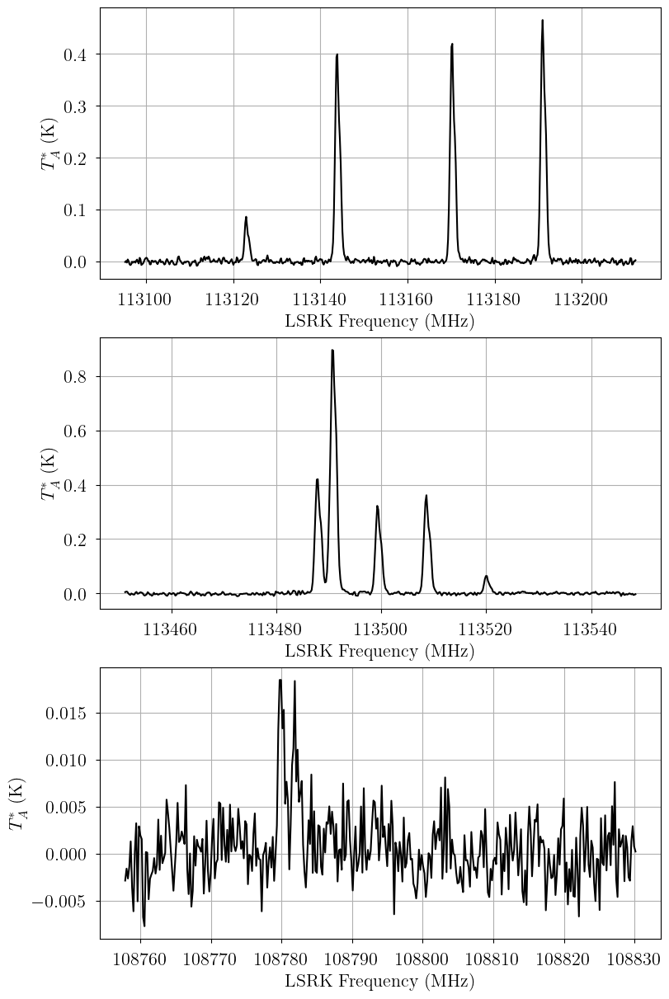

In [2]:
from bayes_spec import SpecData

data_12CN = np.genfromtxt("12CN_G211.59_freq.dat")
data_13CN = np.genfromtxt("13CN_G211.59_freq.dat")

# estimate noise
noise_12CN = 1.4826 * np.median(np.abs(data_12CN[:, 1] - np.median(data_12CN[:, 1])))
print("rms 12CN", noise_12CN)
noise_13CN = 1.4826 * np.median(np.abs(data_13CN[:, 1] - np.median(data_13CN[:, 1])))
print("rms 13CN", noise_13CN)

obs_12CN_1 = SpecData(
    data_12CN[0:600, 0],
    data_12CN[0:600, 1],
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
obs_12CN_2 = SpecData(
    data_12CN[-500:-1, 0],
    data_12CN[-500:-1, 1],
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
obs_13CN = SpecData(
    data_13CN[:, 0],
    data_13CN[:, 1],
    noise_13CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
data = {"12CN-1": obs_12CN_1, "12CN-2": obs_12CN_2, "13CN": obs_13CN}

# arrays of zeros, used for plotting residuals later
res_12CN_1 = SpecData(
    data_12CN[0:600, 0],
    np.zeros_like(data_12CN[0:600, 1]),
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
res_12CN_2 = SpecData(
    data_12CN[-500:-1, 0],
    np.zeros_like(data_12CN[-500:-1, 1]),
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
res_13CN = SpecData(
    data_13CN[:, 0],
    np.zeros_like(data_13CN[:, 1]),
    noise_13CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_A^*$ (K)",
)
res_data = {"12CN-1": res_12CN_1, "12CN-2": res_12CN_2, "13CN": res_13CN}

# subset of 12CN data
data_12CN = {
    label: data[label]
    for label in data.keys() if "12CN" in label
}
res_data_12CN = {
    label: res_data[label]
    for label in res_data.keys() if "12CN" in label
}

# Plot the data
fig, axes = plt.subplots(len(data), layout="constrained", figsize=(8, 12))
for i, label in enumerate(data.keys()):
    axes[i].plot(data[label].spectral, data[label].brightness, 'k-')
    axes[i].set_xlabel(data[label].xlabel)
    axes[i].set_ylabel(data[label].ylabel)

## Reproduce Sun et al. (2024) model

In [3]:
import astropy.units as u
import astropy.constants as c
from bayes_cn_hfs.utils import supplement_mol_data
from bayes_cn_hfs.physics import calc_stat_weight

mol_data_12CN, weight_12CN = supplement_mol_data("CN")

sun2024_tau_ml = 0.86
sun2024_Tex = 4.61*u.K
freq = 113.5*u.GHz

# main line upper state column density
sun2024_Nu_ml = 8.0*np.pi*freq**2.0 / c.c**2.0 / (np.exp(c.h*freq/(c.k_B*sun2024_Tex)) - 1.0) / (mol_data_12CN["Aul"][5]/u.s) / (1.0/u.MHz) * sun2024_tau_ml
print("main line log10 upper column density", np.log10(sun2024_Nu_ml.to('cm-2').value))

# partition function
stat_weights = calc_stat_weight(mol_data_12CN["states"]["deg"], mol_data_12CN["states"]["E"], sun2024_Tex.to("K").value).eval()
Qtot = np.sum(stat_weights)

# total column density
sun2024_log10_Ntot = np.log10(Qtot/stat_weights[6] * sun2024_Nu_ml.to('cm-2').value)
print("log10 total column density", sun2024_log10_Ntot)

main line log10 upper column density 13.066265784892943
log10 total column density 13.862984066023499


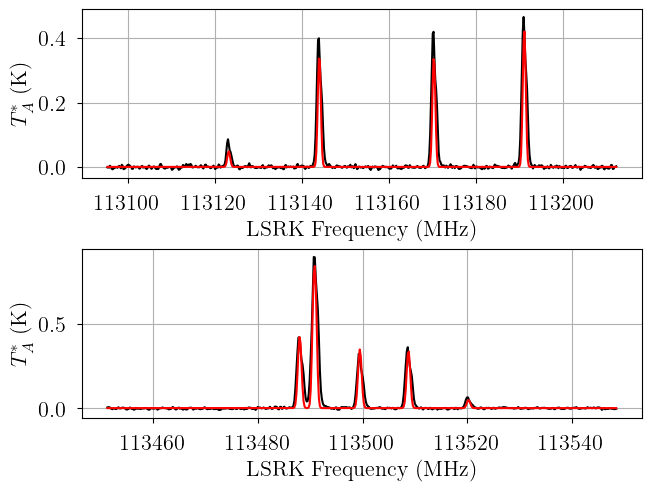

In [4]:
from bayes_cn_hfs.cn_model import CNModel

# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N = [13.5, 0.25], # mean and width of log10 total column density prior (cm-2)
    prior_log10_Tkin = [0.75, 0.25], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = 1.0, # width of latent Lorentzian FWHM prior (km/s) TIP: set to typical feature separation
    prior_rms = {label: 0.03 for label in data_12CN.keys()}, # width of spectral rms prior (K)
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume LTE
    prior_log10_Tex = [0.75, 0.25], # ignored because LTE
    assume_CTEX = True, # implied because LTE
    prior_LTE_precision = 100.0, # ignored because LTE
    fix_log10_Tkin = None, # do not fix the kinetic temperature
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

# Simulate with Sun et al. (2024) parameters
# We choose values for velocity and FWHM that look good
sim_params = {
    "log10_N": [sun2024_log10_Ntot],
    "log10_Tkin": [np.log10(sun2024_Tex.to("K").value)],
    "fwhm_nonthermal": [2.0],
    "velocity": [0.5],
    "fwhm_L": 0.0,
    "rms_12CN-1": 0.0,
    "rms_12CN-2": 0.0,
    "baseline_12CN-1_norm": [0.0],
    "baseline_12CN-2_norm": [0.0],
}
# add derived quantities to sim_params
for key in model.cloud_deterministics:
    if key not in sim_params.keys():
        sim_params[key] = model.model[key].eval(sim_params, on_unused_input="ignore")

# Evaluate and save simulated observations
sim_obs = {label: model.model[label].eval(sim_params, on_unused_input="ignore") for label in data_12CN.keys()}

# Plot the simulated data
fig, axes = plt.subplots(len(data_12CN), layout="constrained")
for i, label in enumerate(data_12CN.keys()):
    axes[i].plot(data_12CN[label].spectral, data_12CN[label].brightness, 'k-')
    axes[i].plot(data_12CN[label].spectral, sim_obs[label], 'r-')
    axes[i].set_xlabel(data_12CN[label].xlabel)
    axes[i].set_ylabel(data_12CN[label].ylabel)

In [5]:
sim_params

{'log10_N': [np.float64(13.862984066023499)],
 'log10_Tkin': [np.float64(0.6637009253896482)],
 'fwhm_nonthermal': [2.0],
 'velocity': [0.5],
 'fwhm_L': 0.0,
 'rms_12CN-1': 0.0,
 'rms_12CN-2': 0.0,
 'baseline_12CN-1_norm': [0.0],
 'baseline_12CN-2_norm': [0.0],
 'fwhm_thermal': array([0.09008744]),
 'fwhm': array([2.00202791]),
 'log10_Tex_ul': array([0.66370093]),
 'Tex': array([[4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61]]),
 'tau': array([[0.03106518],
        [0.25429057],
        [0.24836437],
        [0.32251198],
        [0.32375786],
        [0.86002019],
        [0.25544636],
        [0.2495611 ],
        [0.03122169]]),
 'tau_total': array([2.57623928]),
 'TR': array([[2.4163491 ],
        [2.41603698],
        [2.4156421 ],
        [2.41533052],
        [2.41088554],
        [2.410843  ],
        [2.41071344],
        [2.41057441],
        [2.41040252]])}

This simulation is consistent with the Sun et al. (2024) model, but it is not a great fit to the data.

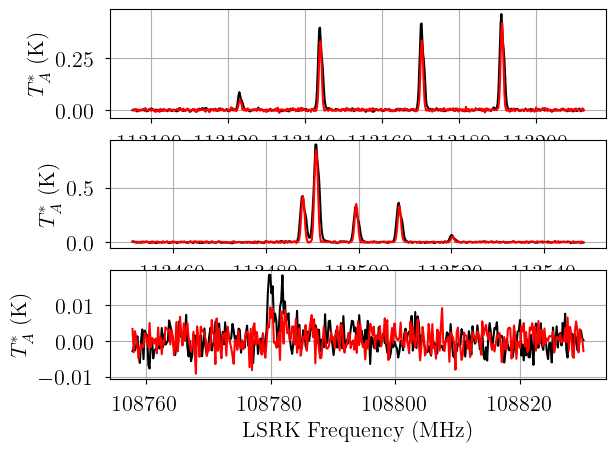

In [6]:
from bayes_cn_hfs import CNRatioModel

sun2024_ratio_12C_13C = 72.2

baseline_degree = 0
n_clouds = 1
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N_12CN = [13.5, 1.0], # mean and width of log10 12CN total column density prior (cm-2)
    prior_ratio_12C_13C = [75.0, 25.0], # mean and width of 12C/13C ratio prior
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume LTE
    prior_log10_Tex = None, # ignored for this LTE model
    assume_CTEX_12CN = True, # implied for this LTE model
    prior_LTE_precision = 100.0, # ignored for this LTE model
    assume_CTEX_13CN = True, # implied for this LTE model
    fix_log10_Tkin = None, # do not fix the kinetic temperature
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

# Simulate with Sun et al. (2024) parameters
# We choose values for velocity and FWHM that look good
sim_params = {
    "log10_N_12CN": [sun2024_log10_Ntot],
    "ratio_12C_13C": [sun2024_ratio_12C_13C],
    "log10_Tkin": [np.log10(sun2024_Tex.to("K").value)],
    "fwhm_nonthermal": [2.0],
    "velocity": [0.5],
    "fwhm_L": 0.0,
    "rms_12CN-1": 0.0,
    "rms_12CN-2": 0.0,
    "rms_13CN": 0.0,
    "baseline_12CN-1_norm": [0.0],
    "baseline_12CN-2_norm": [0.0],
    "baseline_13CN_norm": [0.0],
}
# add derived quantities to sim_params
for key in model.cloud_deterministics:
    if key not in sim_params.keys():
        sim_params[key] = model.model[key].eval(sim_params, on_unused_input="ignore")

# Evaluate and save simulated observations
sim_obs = {key: model.model[key].eval(sim_params, on_unused_input="ignore") for key in data.keys()}

# Plot the simulated data
fig, axes = plt.subplots(len(data.keys()))
for ax, key in zip(axes, data.keys()):
    ax.plot(data[key].spectral, data[key].brightness, "k-")
    ax.plot(data[key].spectral, sim_obs[key], "r-")
    ax.set_xlabel(data[key].xlabel)
    ax.set_ylabel(data[key].ylabel)

In [7]:
sim_params

{'log10_N_12CN': [np.float64(13.862984066023499)],
 'ratio_12C_13C': [72.2],
 'log10_Tkin': [np.float64(0.6637009253896482)],
 'fwhm_nonthermal': [2.0],
 'velocity': [0.5],
 'fwhm_L': 0.0,
 'rms_12CN-1': 0.0,
 'rms_12CN-2': 0.0,
 'rms_13CN': 0.0,
 'baseline_12CN-1_norm': [0.0],
 'baseline_12CN-2_norm': [0.0],
 'baseline_13CN_norm': [0.0],
 'fwhm_thermal_12CN': array([0.09008744]),
 'fwhm_thermal_13CN': array([0.08840342]),
 'fwhm_12CN': array([2.00202791]),
 'fwhm_13CN': array([2.00195284]),
 'N_13CN': array([1.01029189e+12]),
 'log10_Tex_ul': array([0.66370093]),
 'Tex_12CN': array([[4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61]]),
 'tau_12CN': array([[0.03106518],
        [0.25429057],
        [0.24836437],
        [0.32251198],
        [0.32375786],
        [0.86002019],
        [0.25544636],
        [0.2495611 ],
        [0.03122169]]),
 'tau_total_12CN': array([2.57623928]),
 'TR_12CN': array([

The 13CN model is not very consistent with the 13CN data either.

## Ratio Model
We fix the kinetic temperature at the Sun et al. (2024) model value and assume LTE.

In [8]:
from bayes_cn_hfs import CNRatioModel

# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N_12CN = [13.5, 1.0], # mean and width of log10 12CN total column density prior (cm-2)
    prior_ratio_12C_13C = [75.0, 25.0], # mean and width of 12C/13C ratio prior
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume LTE
    prior_log10_Tex = None, # ignored for this LTE model
    assume_CTEX_12CN = True, # implied for this LTE model
    prior_LTE_precision = 100.0, # ignored for this LTE model
    assume_CTEX_13CN = True, # implied for this LTE model
    fix_log10_Tkin = np.log10(sun2024_Tex.to("K").value), # fix the kinetic (excitation) temperature
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, 13CN, baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, ratio_12C_13C, velocity_norm]


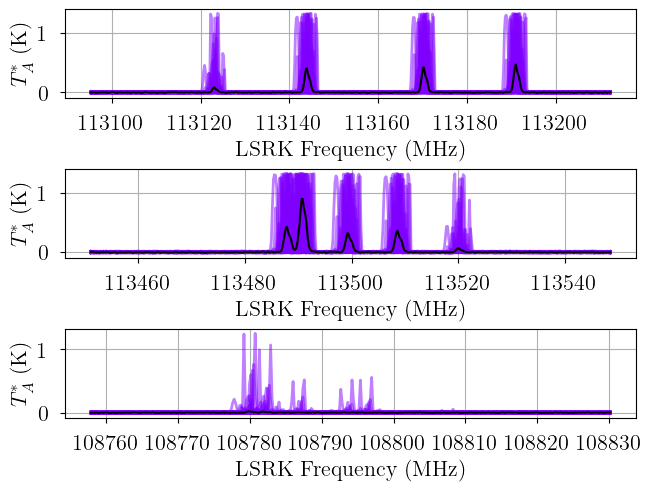

In [9]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [10]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.1, # VI absolute convergence threshold
    learning_rate = 0.02, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 2500
Interrupted at 2,499 [2%]: Average Loss = 29,181


Output()

Runtime: 0.26 minutes


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

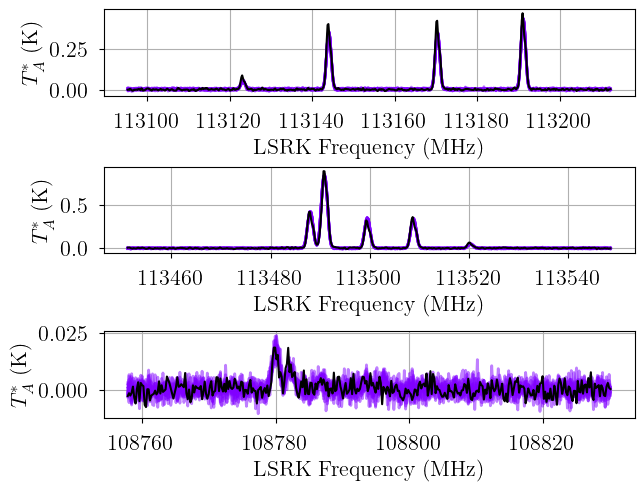

In [11]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [12]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.1,
    "learning_rate": 0.02,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.8}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 2500
Interrupted at 2,499 [2%]: Average Loss = 29,181
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, ratio_12C_13C]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 14 seconds.


Adding log-likelihood to trace


Output()

Runtime: 0.69 minutes


In [13]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


In [14]:
print("solutions:", model.solutions)

pm.summary(model.trace.solution_0)

solutions: [0]


/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],2.820000e-01,4.200000e-02,1.990000e-01,3.580000e-01,0.000000e+00,0.000000e+00,9644.0,5907.0,1.0
baseline_12CN-2_norm[0],-5.450000e-01,4.600000e-02,-6.350000e-01,-4.600000e-01,0.000000e+00,0.000000e+00,9322.0,6707.0,1.0
baseline_13CN_norm[0],-7.600000e-02,5.300000e-02,-1.780000e-01,2.000000e-02,1.000000e-03,1.000000e-03,9664.0,7031.0,1.0
velocity_norm[0],1.500000e-01,1.000000e-03,1.480000e-01,1.520000e-01,0.000000e+00,0.000000e+00,10775.0,6504.0,1.0
log10_N_12CN_norm[0],5.650000e-01,1.000000e-03,5.640000e-01,5.670000e-01,0.000000e+00,0.000000e+00,7679.0,6573.0,1.0
fwhm_nonthermal_norm[0],3.187000e+00,6.000000e-03,3.175000e+00,3.199000e+00,0.000000e+00,0.000000e+00,8337.0,6397.0,1.0
ratio_12C_13C[0],4.479200e+01,3.360000e+00,3.848100e+01,5.098100e+01,3.600000e-02,3.700000e-02,9030.0,6578.0,1.0
velocity[0],4.510000e-01,3.000000e-03,4.450000e-01,4.560000e-01,0.000000e+00,0.000000e+00,10775.0,6504.0,1.0
fwhm_thermal_12CN[0],9.000000e-02,0.000000e+00,9.000000e-02,9.000000e-02,0.000000e+00,NaN,8000.0,8000.0,NaN
fwhm_thermal_13CN[0],8.800000e-02,0.000000e+00,8.800000e-02,8.800000e-02,0.000000e+00,0.000000e+00,8000.0,8000.0,NaN


We find a smaller $^{12}{\rm C}/^{13}{\rm C}$ ratio: $44.8 \pm 3.4$ compared to Sun et al. (2024) who found $52.2 \pm 6.7$ using the traditional HfS method, and $72.2 \pm 9.5$ using the satellite-line method.

Sampling: [12CN-1, 12CN-2, 13CN]


Output()

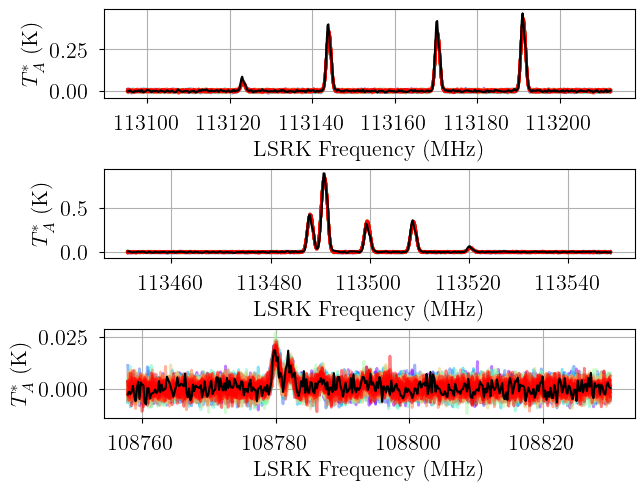

In [15]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

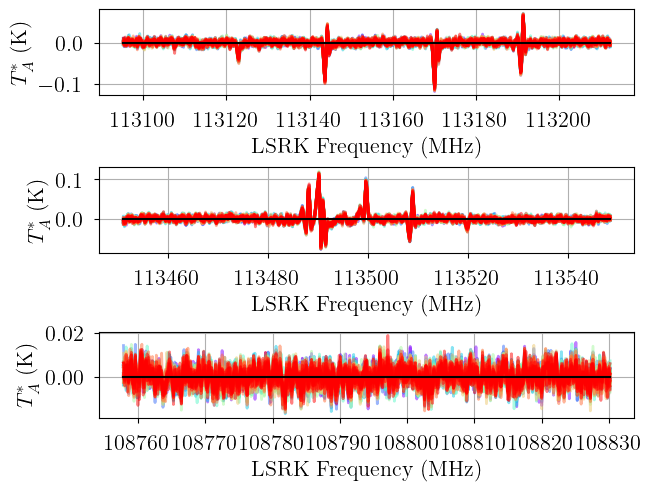

In [16]:
# calculate residuals
posterior["posterior_predictive_residuals"] = posterior.posterior_predictive.copy()
for label in model.data.keys():
    posterior.posterior_predictive_residuals[label] = posterior.posterior_predictive[label] - model.data[label].brightness

_ = plot_predictive(res_data, posterior.posterior_predictive_residuals)

['velocity', 'fwhm_nonthermal', 'fwhm_12CN', 'fwhm_13CN', 'log10_N_12CN', 'N_13CN', 'tau_total_12CN', 'tau_total_13CN']


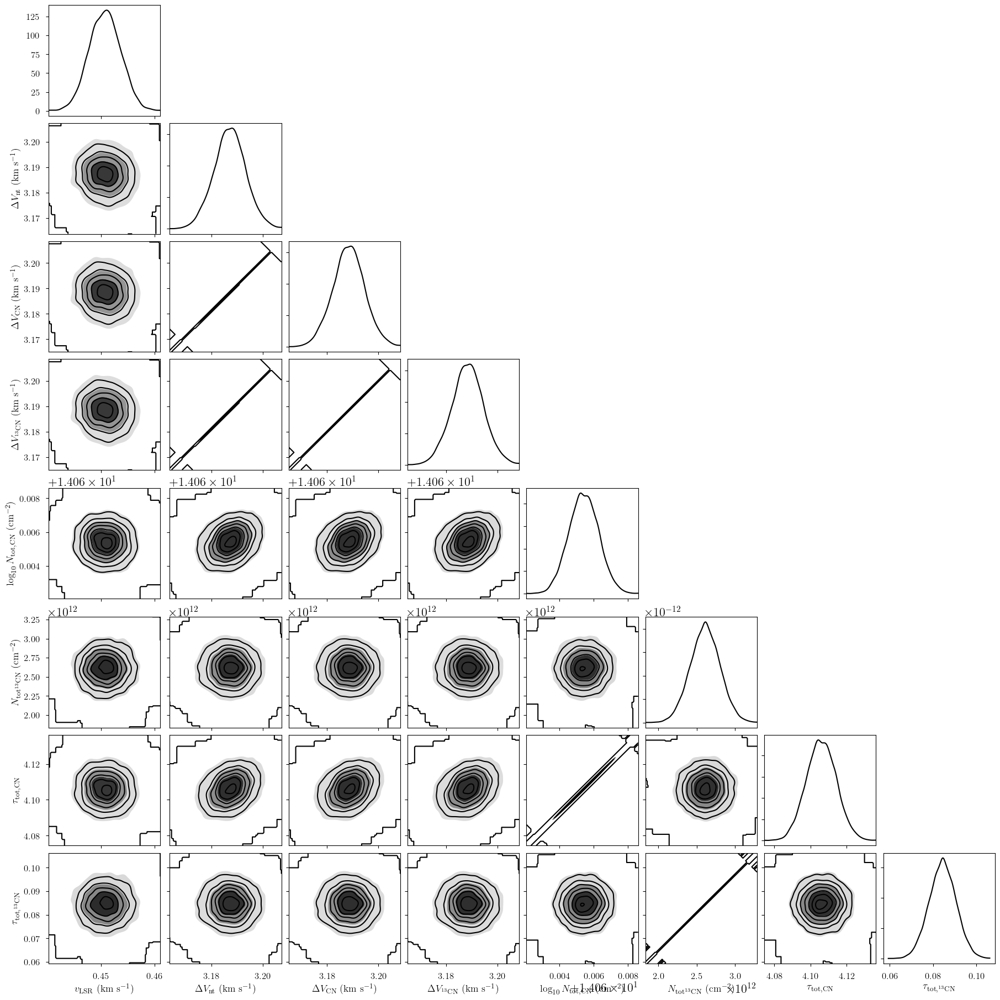

In [17]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(
        ["transition_12CN", "state_12CN", "transition_13CN", "state_13CN"]
    )) and param not in ["fwhm_thermal_12CN", "fwhm_thermal_13CN", "log10_Tex_ul"]
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0, # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
    # reference_values=sim_params, # Sun et al. model
)

## Single component LTE
Mimic Sun et al. (2024) analysis.

In [18]:
# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N = [13.5, 1.0], # mean and width of log10 total column density prior (cm-2)
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume kinetic temperature = excitation temperature
    prior_log10_Tex = None, # ignored for this LTE model
    assume_CTEX = True, # assume CTEX
    prior_LTE_precision = None, # ignored for this LTE model
    fix_log10_Tkin = None, # do not fix the kinetic temperature
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tkin_norm, velocity_norm]


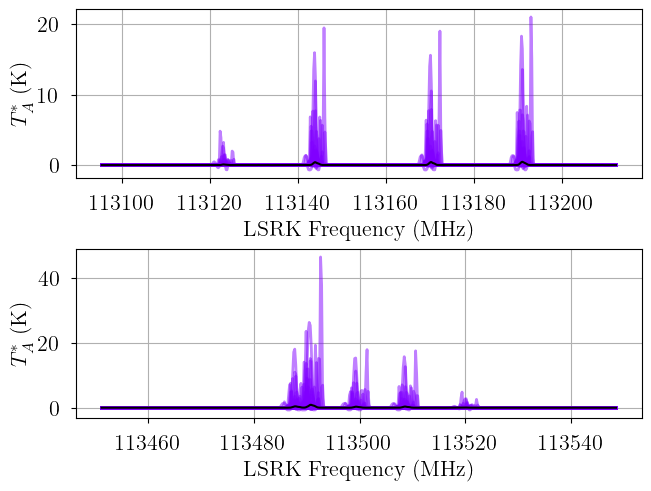

In [19]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [20]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.1, # VI absolute convergence threshold
    learning_rate = 0.02, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 2900
Interrupted at 2,899 [2%]: Average Loss = 1.2062e+05


Output()

Runtime: 0.21 minutes


Sampling: [12CN-1, 12CN-2]


Output()

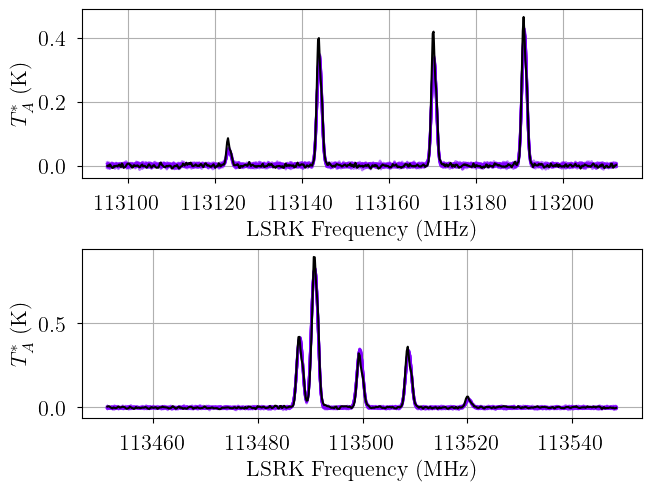

In [21]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [22]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.1,
    "learning_rate": 0.02,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.8}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 2900
Interrupted at 2,899 [2%]: Average Loss = 1.2062e+05
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, log10_Tkin_norm, fwhm_nonthermal_norm, log10_N_norm]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 19 seconds.


Adding log-likelihood to trace


Output()

Runtime: 0.71 minutes


In [23]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


Sampling: [12CN-1, 12CN-2]


Output()

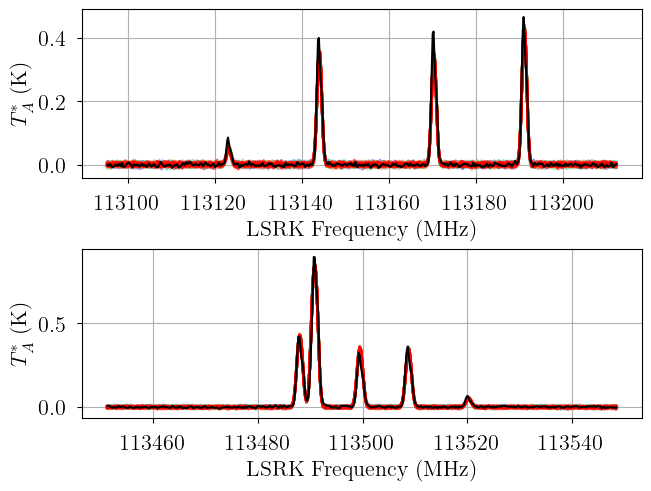

In [24]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

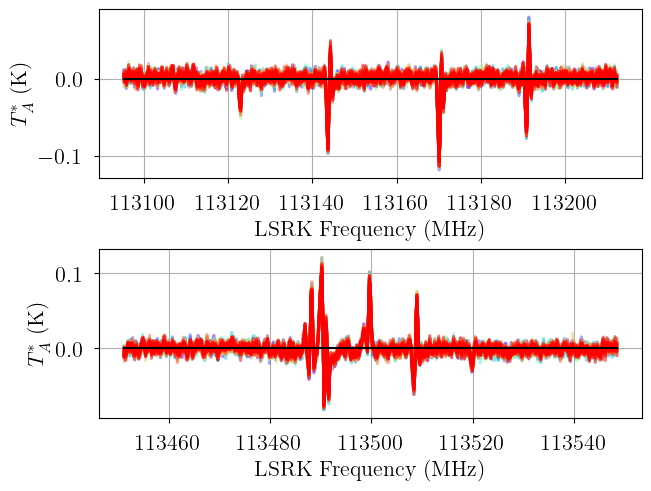

In [25]:
# calculate residuals
posterior["posterior_predictive_residuals"] = posterior.posterior_predictive.copy()
for label in model.data.keys():
    posterior.posterior_predictive_residuals[label] = posterior.posterior_predictive[label] - model.data[label].brightness

_ = plot_predictive(res_data_12CN, posterior.posterior_predictive_residuals)

In [26]:
pm.summary(model.trace.solution_0)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],0.272,0.041,0.192,0.345,0.000,0.001,8279.0,5879.0,1.0
baseline_12CN-2_norm[0],-0.544,0.045,-0.625,-0.456,0.001,0.001,8175.0,5693.0,1.0
velocity_norm[0],0.150,0.001,0.149,0.152,0.000,0.000,7501.0,5435.0,1.0
log10_Tkin_norm[0],-0.681,0.003,-0.687,-0.676,0.000,0.000,4527.0,4646.0,1.0
log10_N_norm[0],0.575,0.003,0.569,0.582,0.000,0.000,4623.0,4592.0,1.0
fwhm_nonthermal_norm[0],3.181,0.007,3.168,3.193,0.000,0.000,7263.0,5484.0,1.0
velocity[0],0.451,0.003,0.446,0.457,0.000,0.000,7501.0,5435.0,1.0
log10_Tkin[0],0.659,0.001,0.657,0.662,0.000,0.000,4527.0,4646.0,1.0
fwhm_thermal[0],0.090,0.000,0.089,0.090,0.000,0.000,4527.0,4646.0,1.0
fwhm_nonthermal[0],3.181,0.007,3.168,3.193,0.000,0.000,7263.0,5484.0,1.0


['velocity', 'log10_Tkin', 'fwhm_thermal', 'fwhm_nonthermal', 'fwhm', 'log10_N', 'log10_Tex_ul', 'tau_total']


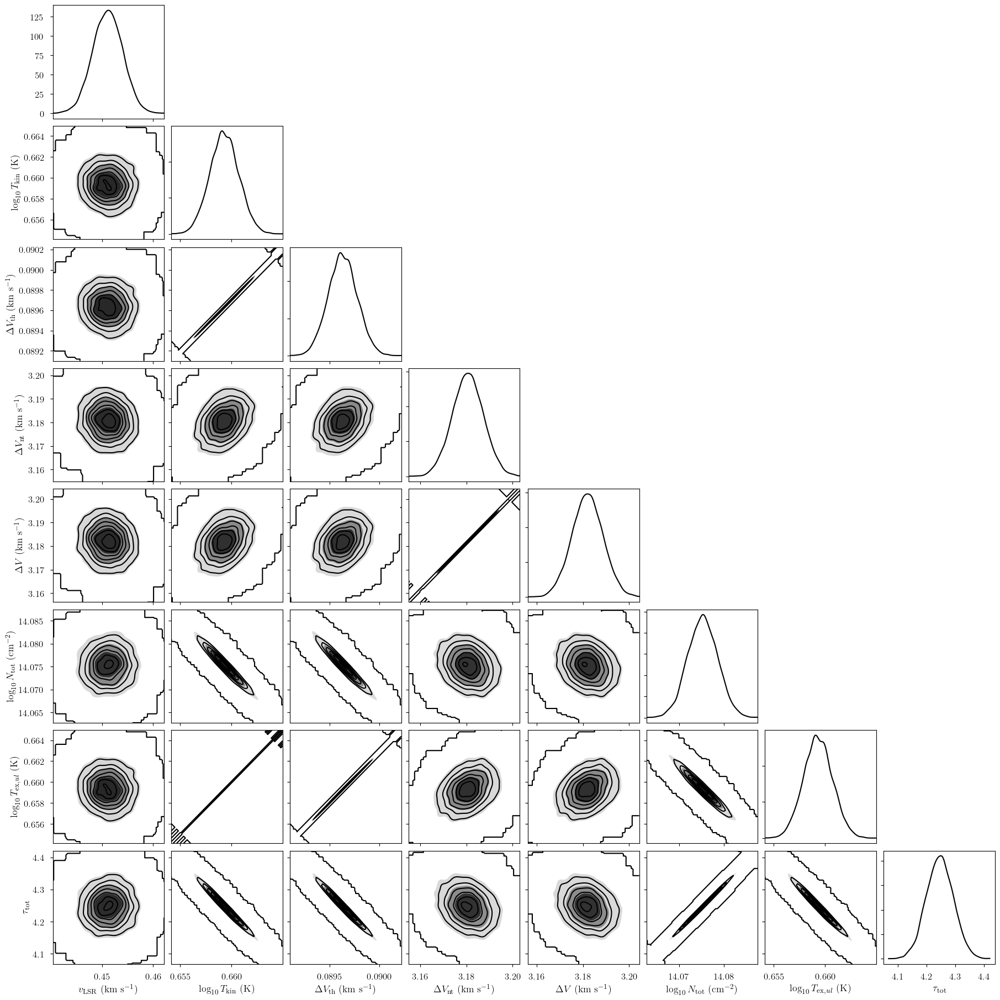

In [27]:
from bayes_spec.plots import plot_pair

# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "state"]))
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + model.hyper_freeRVs, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
    # reference_values=sim_params, # Sun et al. results
)

We find a higher column density and optical depth, but a similar excitation temperature.

## Non-LTE model
Fix the kinetic temperature

In [28]:
# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N = [13.5, 1.0], # mean and width of log10 total column density prior (cm-2)
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [0.5, 0.1], # mean and width of log10 excitation temperature prior (K)
    assume_CTEX = False, # do not assume CTEX
    prior_LTE_precision = 100.0, # width of LTE precision prior
    fix_log10_Tkin = 1.5, # fix the kinetic temperature
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, LTE_precision, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, velocity_norm, weights]


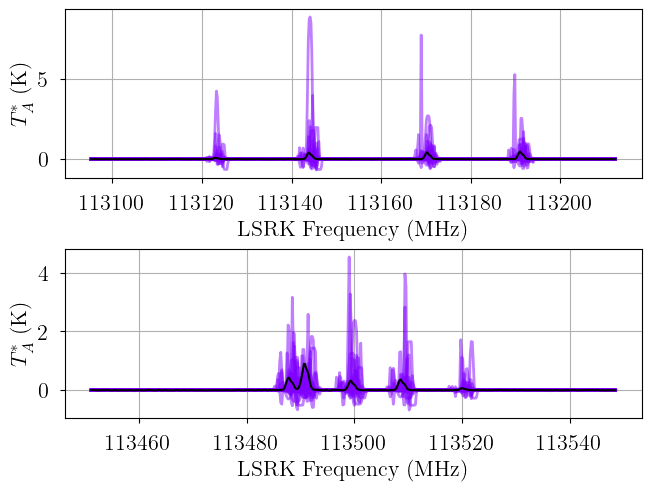

In [29]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [30]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.1, # VI absolute convergence threshold
    learning_rate = 0.02, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 4200
Interrupted at 4,199 [4%]: Average Loss = 3.7001e+07


Output()

Runtime: 0.23 minutes


Sampling: [12CN-1, 12CN-2]


Output()

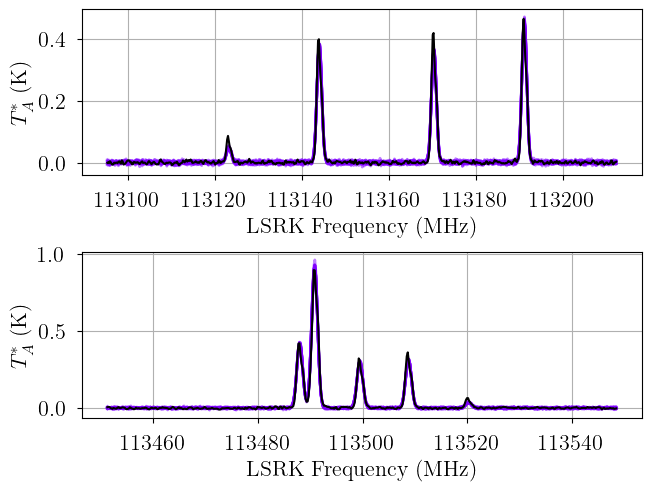

In [31]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [32]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.1,
    "learning_rate": 0.02,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.8}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 4200
Interrupted at 4,199 [4%]: Average Loss = 3.7001e+07
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, LTE_precision, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 135 seconds.


Adding log-likelihood to trace


Output()

Runtime: 2.67 minutes


In [33]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


Sampling: [12CN-1, 12CN-2]


Output()

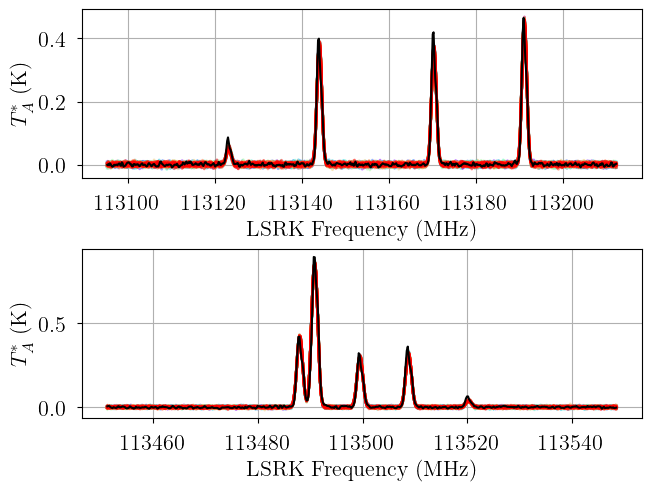

In [34]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

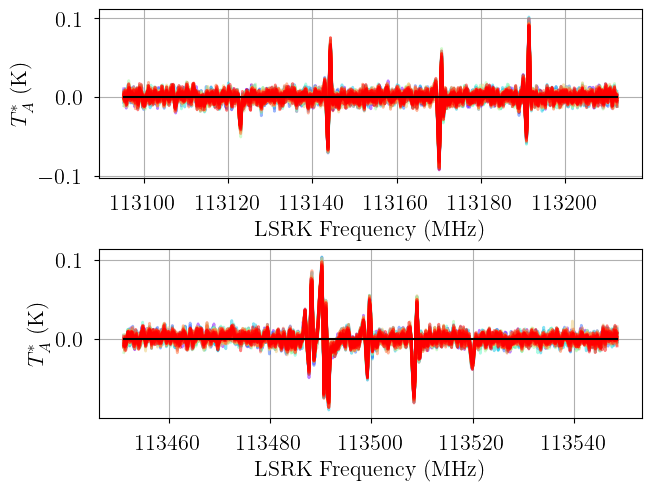

In [35]:
# calculate residuals
posterior["posterior_predictive_residuals"] = posterior.posterior_predictive.copy()
for label in model.data.keys():
    posterior.posterior_predictive_residuals[label] = posterior.posterior_predictive[label] - model.data[label].brightness

_ = plot_predictive(res_data_12CN, posterior.posterior_predictive_residuals)

In [36]:
pm.summary(model.trace.solution_0)

/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],-0.032,0.042,-0.107,0.049,0.001,0.000,5351.0,4621.0,1.0
baseline_12CN-2_norm[0],-0.233,0.047,-0.321,-0.143,0.001,0.001,6222.0,5126.0,1.0
velocity_norm[0],0.152,0.001,0.150,0.153,0.000,0.000,5792.0,4429.0,1.0
log10_N_norm[0],0.421,0.014,0.395,0.446,0.000,0.000,1370.0,2306.0,1.0
log10_Tex_ul_norm[0],2.380,0.341,1.696,2.975,0.006,0.006,3317.0,2999.0,1.0
fwhm_nonthermal_norm[0],3.294,0.012,3.271,3.315,0.000,0.000,1746.0,2980.0,1.0
LTE_precision[0],0.002,0.002,0.000,0.005,0.000,0.000,3964.0,4327.0,1.0
"weights[0, 0 0 1 1]",0.147,0.003,0.142,0.152,0.000,0.000,1492.0,2674.0,1.0
"weights[0, 0 0 1 2]",0.315,0.004,0.308,0.323,0.000,0.000,1406.0,2407.0,1.0
"weights[0, 1 0 1 1]",0.066,0.001,0.064,0.068,0.000,0.000,1412.0,2410.0,1.0


This model is both physically consistent and a better match to the data. There appears to be evidence for multiple cloud components.

['velocity', 'fwhm_nonthermal', 'fwhm', 'log10_N', 'log10_Tex_ul', 'tau_total']


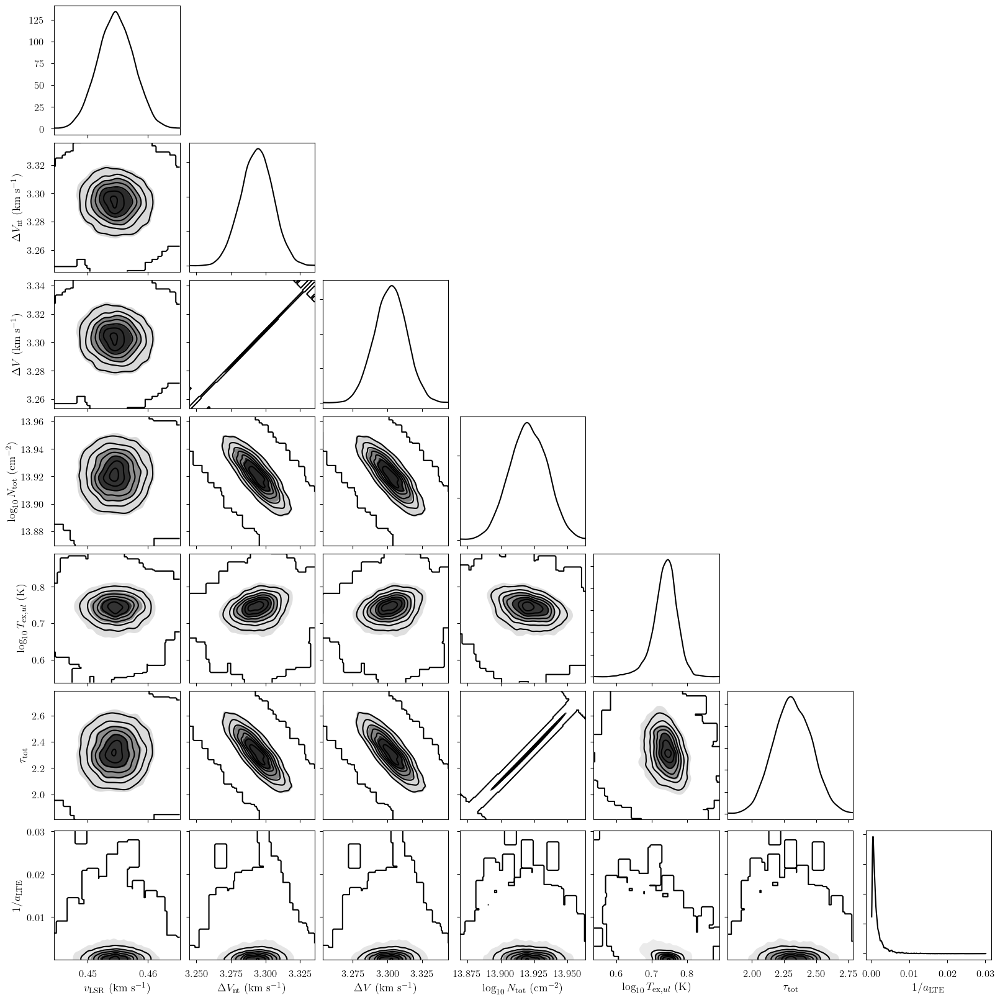

In [37]:
# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "state"]))
    and param not in ["fwhm_thermal"]
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + model.hyper_freeRVs + ['LTE_precision'], # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

## Number of clouds

In [38]:
from bayes_spec import Optimize
from bayes_cn_hfs import CNModel

max_n_clouds = 5
baseline_degree = 0
opt = Optimize(
    CNModel,
    data_12CN,
    molecule="CN", # molecule name
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    max_n_clouds=max_n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
opt.add_priors(
    prior_log10_N = [13.5, 1.0], # mean and width of log10 total column density prior (cm-2)
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [0.5, 0.1], # mean and width of log10 excitation temperature prior (K)
    assume_CTEX = False, # do not assume CTEX
    prior_LTE_precision = 100.0, # width of LTE precision prior
    fix_log10_Tkin = 1.5, # fix the kinetic temperature
    ordered = False, # do not assume optically-thin
)
opt.add_likelihood()

Sampling: [12CN-1, 12CN-2, LTE_precision, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, velocity_norm, weights]


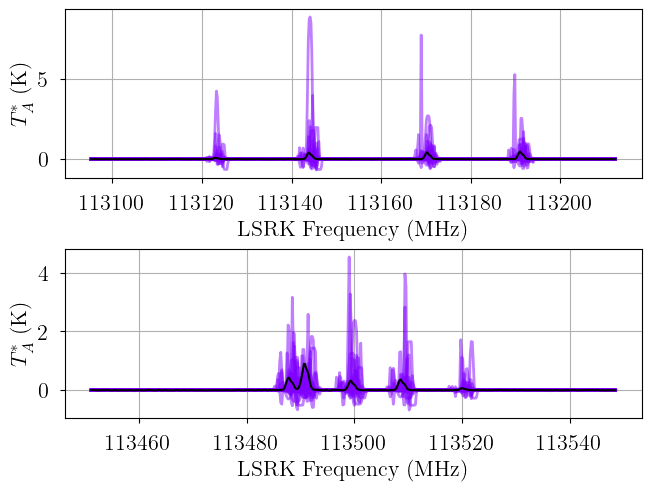

In [39]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = opt.models[1].sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(opt.models[1].data, prior.prior_predictive)

In [40]:
start = time.time()
fit_kwargs = {
    "n": 100_000,
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.1,
    "learning_rate": 0.02,
}
opt.fit_all(**fit_kwargs)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Null hypothesis BIC = 4.940e+05
Approximating n_cloud = 1 posterior...


Output()

Convergence achieved at 4200
Interrupted at 4,199 [4%]: Average Loss = 3.7001e+07


Output()

n_cloud = 1 BIC = 1.174e+02

Approximating n_cloud = 2 posterior...


Output()

Convergence achieved at 3500
Interrupted at 3,499 [3%]: Average Loss = 2.1007e+09


Output()

n_cloud = 2 BIC = -2.593e+03

Approximating n_cloud = 3 posterior...


Output()

Convergence achieved at 17000
Interrupted at 16,999 [16%]: Average Loss = 5.1365e+60


Output()

n_cloud = 3 BIC = -8.056e+03

Approximating n_cloud = 4 posterior...


Output()

Convergence achieved at 57700
Interrupted at 57,699 [57%]: Average Loss = 2.0333e+29


Output()

n_cloud = 4 BIC = -8.176e+03

Approximating n_cloud = 5 posterior...


Output()

Finished [100%]: Average Loss = -3,996.5


Output()

n_cloud = 5 BIC = -7.285e+03

Runtime: 5.68 minutes


[ 4.93955056e+05  1.17439249e+02 -2.59289425e+03 -8.05555563e+03
 -8.17646229e+03 -7.28531186e+03]


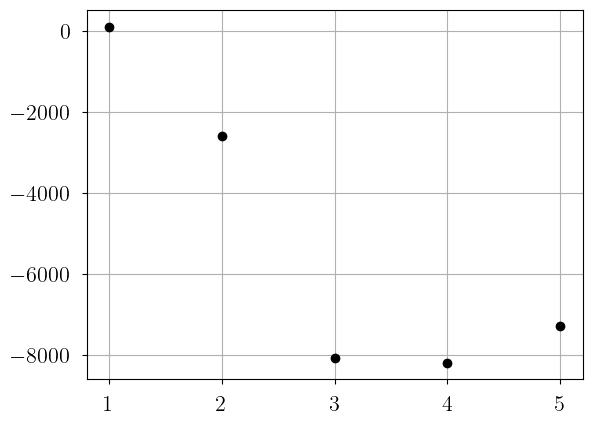

In [41]:
null_bic = opt.models[1].null_bic()
n_clouds = np.arange(max_n_clouds+1)
bics_vi = np.array([null_bic] + [model.bic(chain=0) for model in opt.models.values()])
print(bics_vi)

plt.plot(n_clouds[1:], bics_vi[1:], 'ko')

In [43]:
start = time.time()
fit_kwargs = {
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.1,
    "learning_rate": 0.02,
}
sample_kwargs = {
    "chains": 8,
    "cores": 8,
    "n_init": 100_000,
    "init_kwargs": fit_kwargs,
    "nuts_kwargs": {"target_accept": 0.8},
}
opt.optimize(fit_kwargs=fit_kwargs, sample_kwargs=sample_kwargs, approx=False)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Null hypothesis BIC = 4.940e+05
CHECK {'rel_tolerance': 0.01, 'abs_tolerance': 0.1, 'learning_rate': 0.02}
Sampling n_cloud = 1 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 4200
Interrupted at 4,199 [4%]: Average Loss = 3.7001e+07
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, LTE_precision, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 133 seconds.


Adding log-likelihood to trace


Output()

GMM converged to unique solution
n_cloud = 1 solution = 0 BIC = -7.820e+02

Sampling n_cloud = 2 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 3500
Interrupted at 3,499 [3%]: Average Loss = 2.1007e+09
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, LTE_precision, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 1367 seconds.


Adding log-likelihood to trace


Output()

GMM converged to unique solution
n_cloud = 2 solution = 0 BIC = -6.559e+03

Sampling n_cloud = 3 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 17000
Interrupted at 16,999 [16%]: Average Loss = 5.1365e+60
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, LTE_precision, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 2547 seconds.


Adding log-likelihood to trace


Output()

There were 1855 divergences in converged chains.
GMM converged to unique solution
6 of 8 chains appear converged.
n_cloud = 3 solution = 0 BIC = -8.125e+03

Sampling n_cloud = 4 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 57700
Interrupted at 57,699 [57%]: Average Loss = 2.0333e+29
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, LTE_precision, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 1614 seconds.


Adding log-likelihood to trace


Output()

There were 1 divergences in converged chains.
GMM converged to unique solution
n_cloud = 4 solution = 0 BIC = -8.677e+03

Sampling n_cloud = 5 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Finished [100%]: Average Loss = -3,996.5
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, LTE_precision, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 3047 seconds.


Adding log-likelihood to trace


Output()

There were 231 divergences in converged chains.
GMM converged to unique solution
3 of 8 chains appear converged.
n_cloud = 5 solution = 0 BIC = -8.717e+03

Runtime: 151.77 minutes


[493955.05587382   -781.96673311  -6558.5165649   -8125.15836737
  -8676.91152665  -8716.61505635]


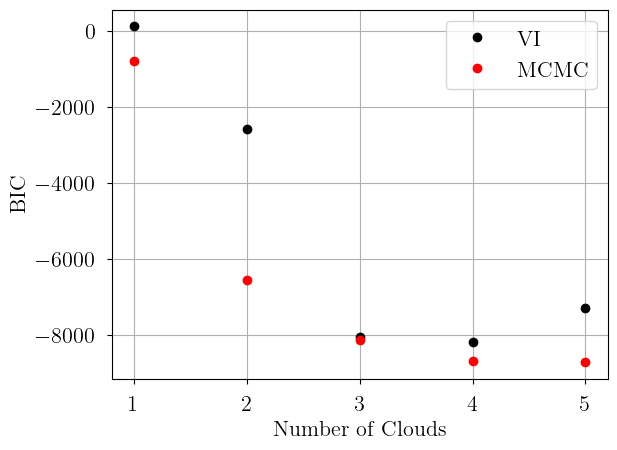

In [44]:
null_bic = opt.models[1].null_bic()
n_clouds = np.arange(max_n_clouds+1)
bics_mcmc = np.array([null_bic] + [model.bic() for model in opt.models.values()])
print(bics_mcmc)

plt.plot(n_clouds[1:], bics_vi[1:], 'ko', label="VI")
plt.plot(n_clouds[1:], bics_mcmc[1:], 'ro', label="MCMC")
plt.xlabel("Number of Clouds")
plt.ylabel("BIC")
_ = plt.legend()

In [45]:
model = opt.models[4]
print(model.n_clouds)
model.solve()

# ignore transition and state dependent parameters
pm.summary(model.trace.solution_0)

4
GMM converged to unique solution


/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],-0.101,0.044,-0.179,-0.014,0.000,0.000,10860.0,5996.0,1.00
baseline_12CN-2_norm[0],-0.314,0.049,-0.405,-0.222,0.000,0.001,10446.0,6075.0,1.00
velocity_norm[0],0.204,0.004,0.197,0.211,0.000,0.000,4648.0,5596.0,1.00
velocity_norm[1],-0.016,0.042,-0.094,0.060,0.001,0.000,2821.0,4919.0,1.00
velocity_norm[2],0.464,0.009,0.447,0.480,0.000,0.000,3277.0,4767.0,1.00
velocity_norm[3],-0.301,0.008,-0.316,-0.286,0.000,0.000,4425.0,5004.0,1.00
log10_N_norm[0],0.006,0.067,-0.123,0.127,0.002,0.001,1668.0,1736.0,1.00
log10_N_norm[1],0.483,0.057,0.371,0.584,0.001,0.001,1968.0,2926.0,1.00
log10_N_norm[2],0.759,0.032,0.697,0.816,0.001,0.000,2361.0,4154.0,1.01
log10_N_norm[3],-0.047,0.065,-0.170,0.073,0.001,0.001,2497.0,3278.0,1.00


Sampling: [12CN-1, 12CN-2]


Output()

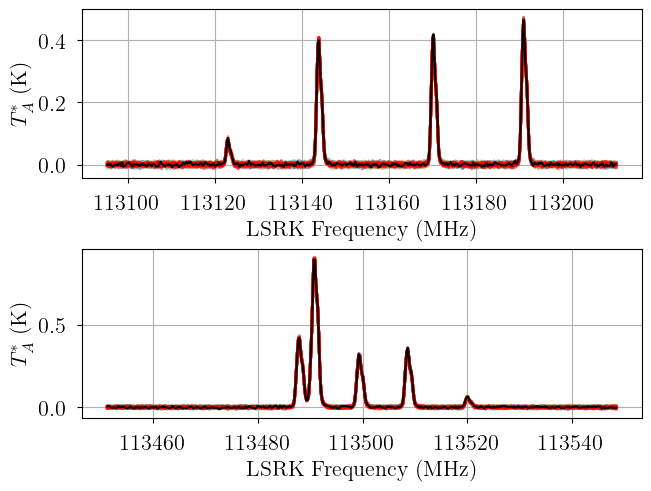

In [46]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

['velocity', 'fwhm_nonthermal', 'fwhm', 'log10_N', 'log10_Tex_ul', 'tau_total']


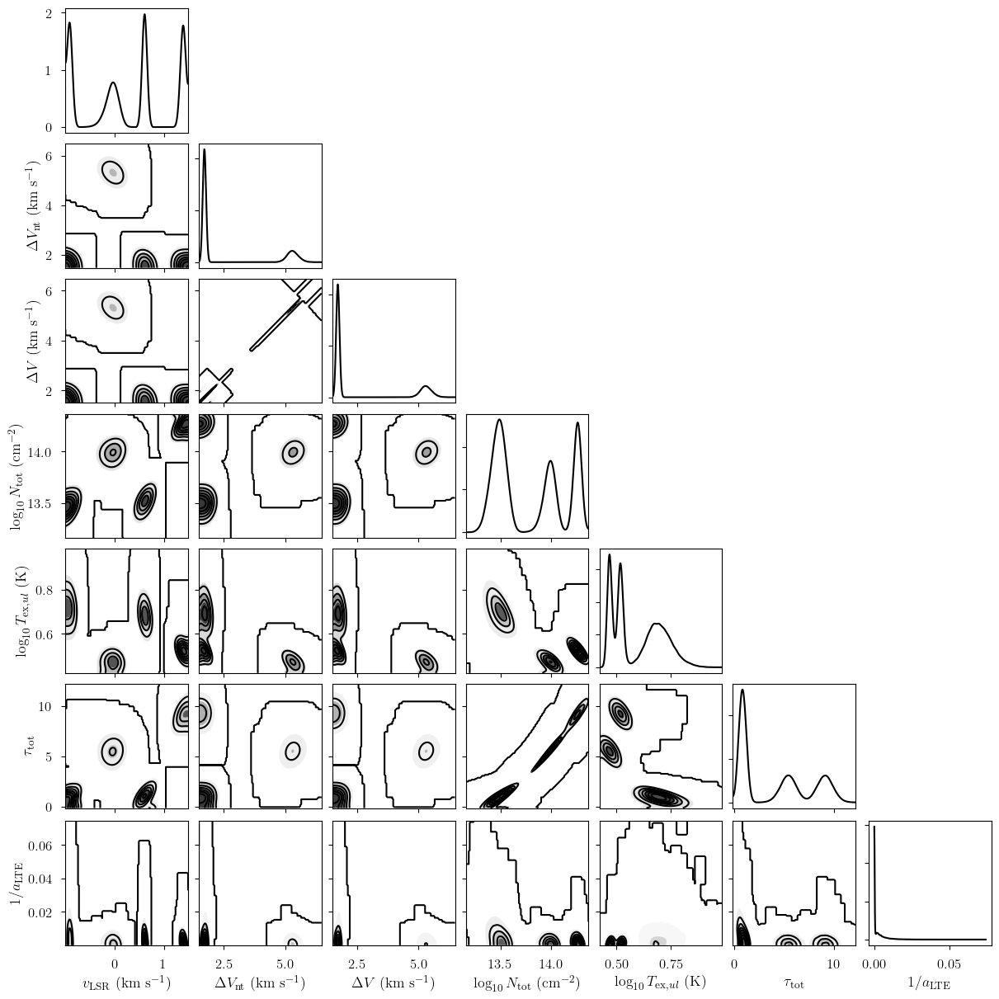

In [47]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "state"]))
    and param not in ["fwhm_thermal"]
]
print(var_names)
axes = plot_pair(
    model.trace.solution_0, # samples
    var_names + ["LTE_precision"], # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)
_ = axes.ravel()[0].figure.set_size_inches(12, 12)

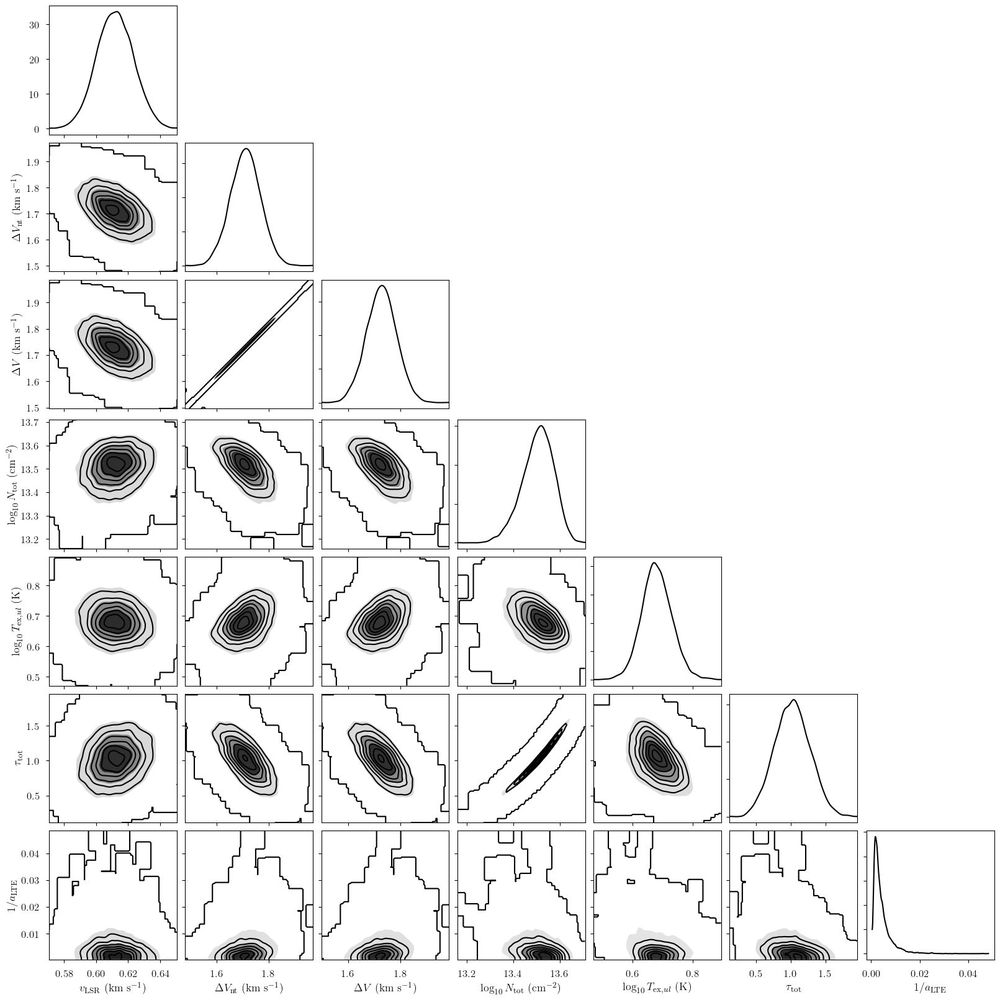

In [48]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + ["LTE_precision"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

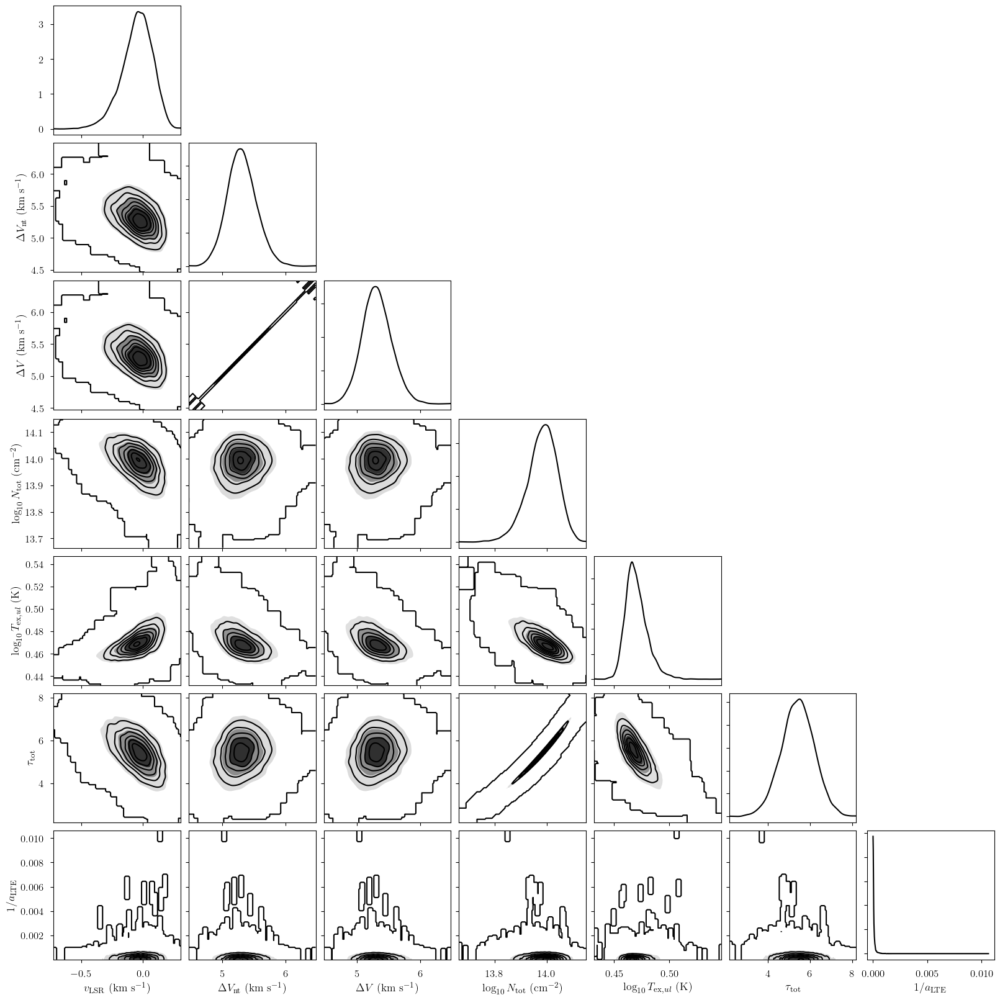

In [49]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1), # samples
    var_names + ["LTE_precision"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

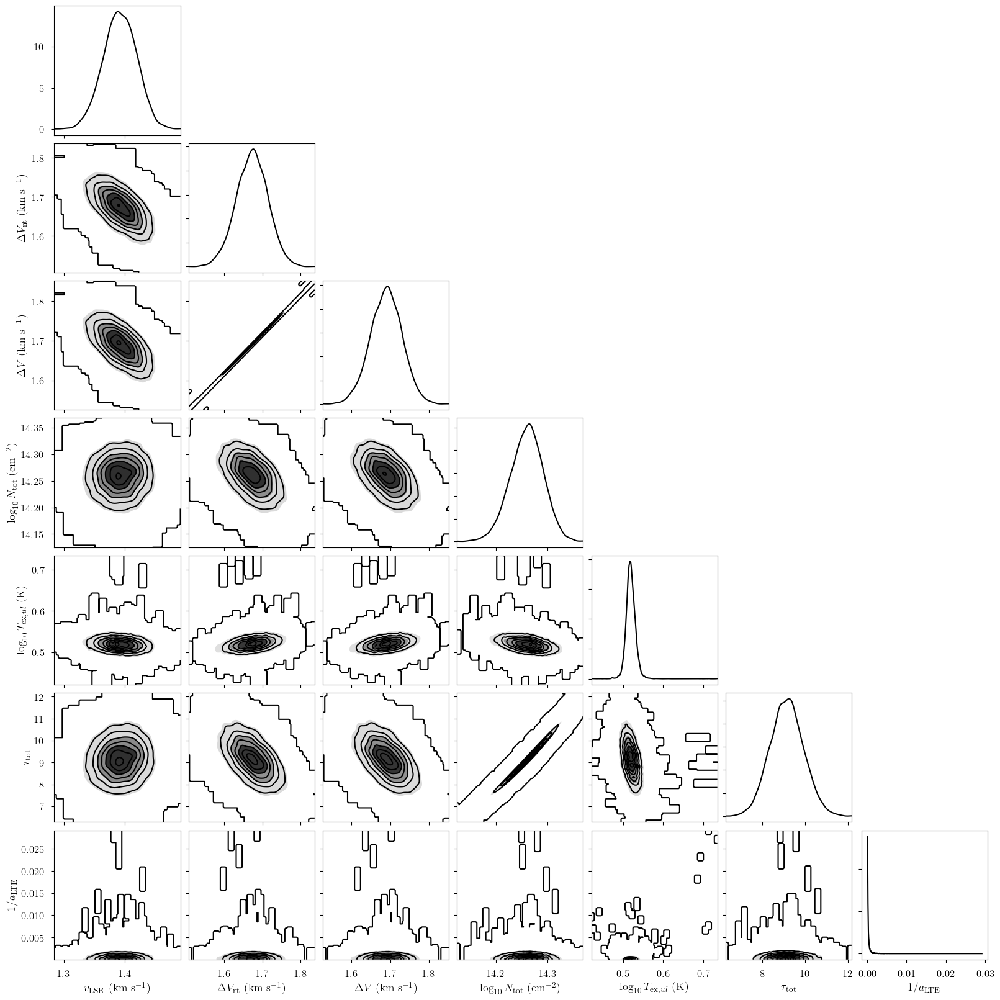

In [50]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2), # samples
    var_names + ["LTE_precision"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

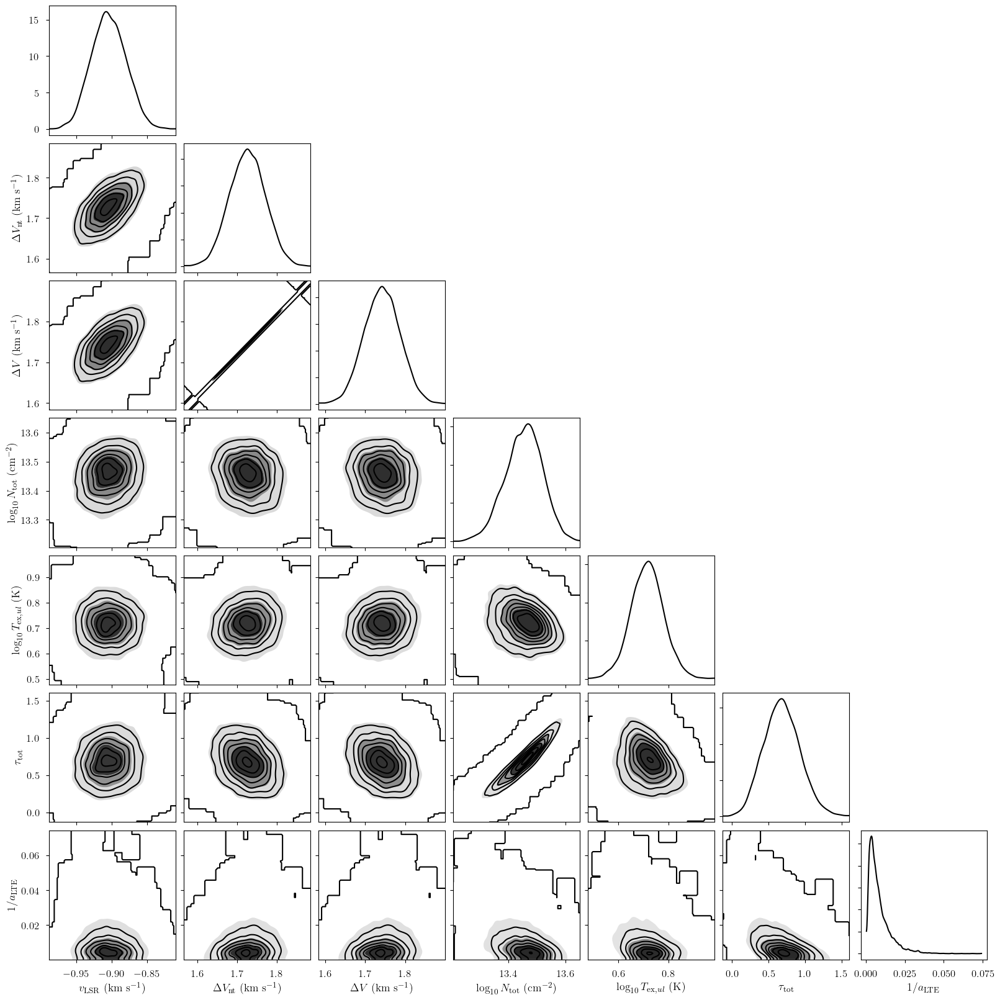

In [51]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=3), # samples
    var_names + ["LTE_precision"] + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

## Ratio Model
There is evidence for degeneracies in the `n_cloud=5` solution, so we instead fit an `n_cloud=4` `CNRatioModel`. We assume CTEX for 13CN.

In [6]:
from bayes_cn_hfs.cn_ratio_model import CNRatioModel

# Initialize and define the model
n_clouds = 4 # number of cloud components
baseline_degree = 0 # polynomial baseline degree
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N_12CN = [13.5, 1.0], # mean and width of log10 12CN total column density prior (cm-2)
    prior_ratio_12C_13C = [75.0, 25.0], # mean and width of 12C/13C ratio prior
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [0.5, 0.1], # mean and width of excitation temperature prior (K)
    assume_CTEX_12CN = False, # do not assume CTEX
    prior_LTE_precision = 100.0, # width of LTE precision prior
    assume_CTEX_13CN = False, # do not assume CTEX for 13CN
    fix_log10_Tkin = 1.5, # kinetic temperature is fixed (K)
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, 13CN, LTE_precision, baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, log10_Tex_ul_norm, ratio_12C_13C, velocity_norm, weights_12CN, weights_13CN]


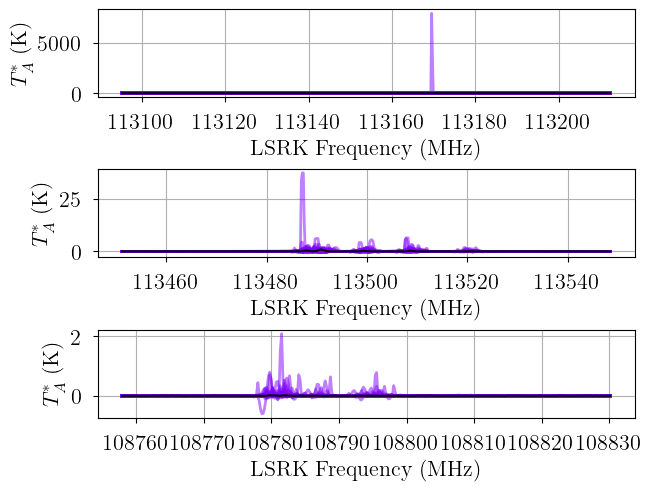

In [7]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [8]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.12, # VI absolute convergence threshold
    learning_rate = 0.02, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 13500
Interrupted at 13,499 [13%]: Average Loss = 3.7341e+19


Output()

Runtime: 0.94 minutes


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

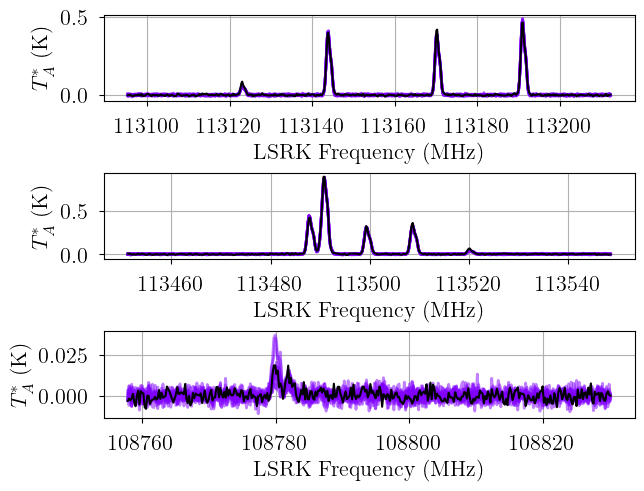

In [9]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [10]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.12,
    "learning_rate": 0.02,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.8}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 13500
Interrupted at 13,499 [13%]: Average Loss = 3.7341e+19
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, ratio_12C_13C, log10_Tex_ul_norm, LTE_precision, weights_12CN, weights_13CN]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 6558 seconds.


Adding log-likelihood to trace


Output()

There were 275 divergences in converged chains.
Runtime: 110.49 minutes


In [11]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution
7 of 8 chains appear converged.


In [12]:
print("solutions:", model.solutions)

pm.summary(model.trace.solution_0)

solutions: [0]


/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],-5.000000e-02,4.200000e-02,-1.290000e-01,3.100000e-02,0.000000e+00,1.000000e-03,12473.0,4854.0,1.00
baseline_12CN-2_norm[0],-2.650000e-01,4.900000e-02,-3.580000e-01,-1.760000e-01,0.000000e+00,1.000000e-03,11433.0,4824.0,1.00
baseline_13CN_norm[0],-7.400000e-02,5.600000e-02,-1.820000e-01,2.900000e-02,1.000000e-03,1.000000e-03,12124.0,4449.0,1.00
velocity_norm[0],1.000000e-02,1.100000e-02,-9.000000e-03,3.100000e-02,0.000000e+00,0.000000e+00,3676.0,4606.0,1.00
velocity_norm[1],-3.720000e-01,9.000000e-03,-3.890000e-01,-3.550000e-01,0.000000e+00,0.000000e+00,3822.0,5053.0,1.00
velocity_norm[2],3.400000e-01,6.000000e-03,3.300000e-01,3.500000e-01,0.000000e+00,0.000000e+00,4564.0,4509.0,1.00
velocity_norm[3],-3.630000e-01,5.000000e-03,-3.720000e-01,-3.540000e-01,0.000000e+00,0.000000e+00,4332.0,4742.0,1.00
log10_N_12CN_norm[0],1.200000e-02,5.800000e-02,-9.500000e-02,1.210000e-01,2.000000e-03,1.000000e-03,1314.0,2209.0,1.00
log10_N_12CN_norm[1],2.850000e-01,4.300000e-02,1.990000e-01,3.590000e-01,1.000000e-03,0.000000e+00,2088.0,3804.0,1.00
log10_N_12CN_norm[2],8.740000e-01,2.400000e-02,8.320000e-01,9.220000e-01,1.000000e-03,0.000000e+00,2009.0,3120.0,1.00


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

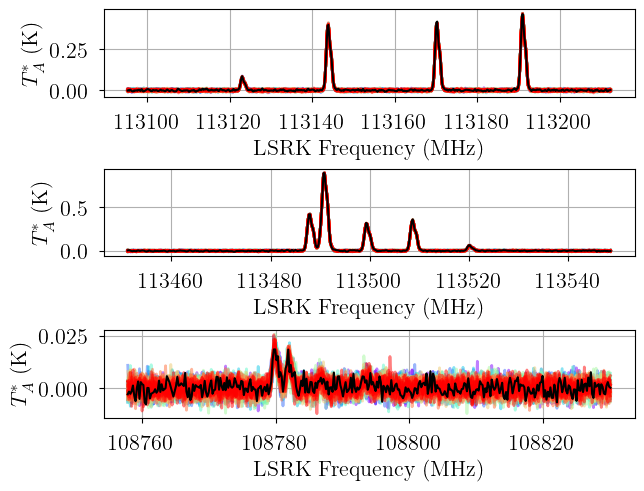

In [13]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [14]:
# 12C/13C ratio over all clouds
for solution in model.solutions:
    model.trace[f"solution_{solution}"]["ratio_12C_13C_total"] = (
        (10.0**model.trace[f"solution_{solution}"]["log10_N_12CN"]).sum(dim="cloud") / 
        model.trace[f"solution_{solution}"]["N_13CN"].sum(dim="cloud")
    )

In [15]:
pm.summary(model.trace.solution_0, var_names=["ratio_12C_13C_total"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ratio_12C_13C_total,67.441,14.305,41.092,94.142,0.2,0.155,5082.0,4542.0,1.0


['velocity', 'fwhm_nonthermal', 'fwhm_12CN', 'fwhm_13CN', 'log10_N_12CN', 'N_13CN', 'log10_Tex_ul', 'tau_total_12CN', 'tau_total_13CN']


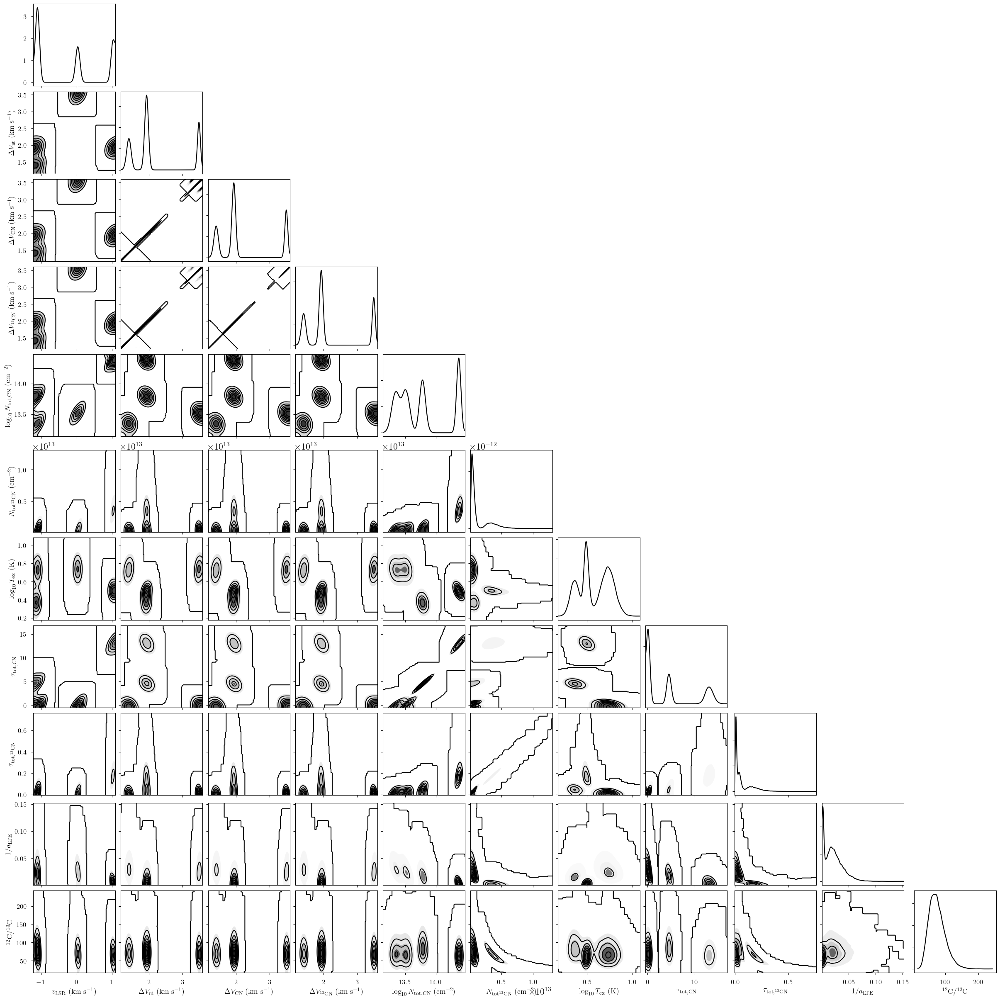

In [16]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(
        ["transition_12CN", "state_12CN", "transition_13CN", "state_13CN"]
    )) and param not in ["fwhm_thermal_12CN", "fwhm_thermal_13CN"]
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0, # samples
    var_names + ["LTE_precision", "ratio_12C_13C"], # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

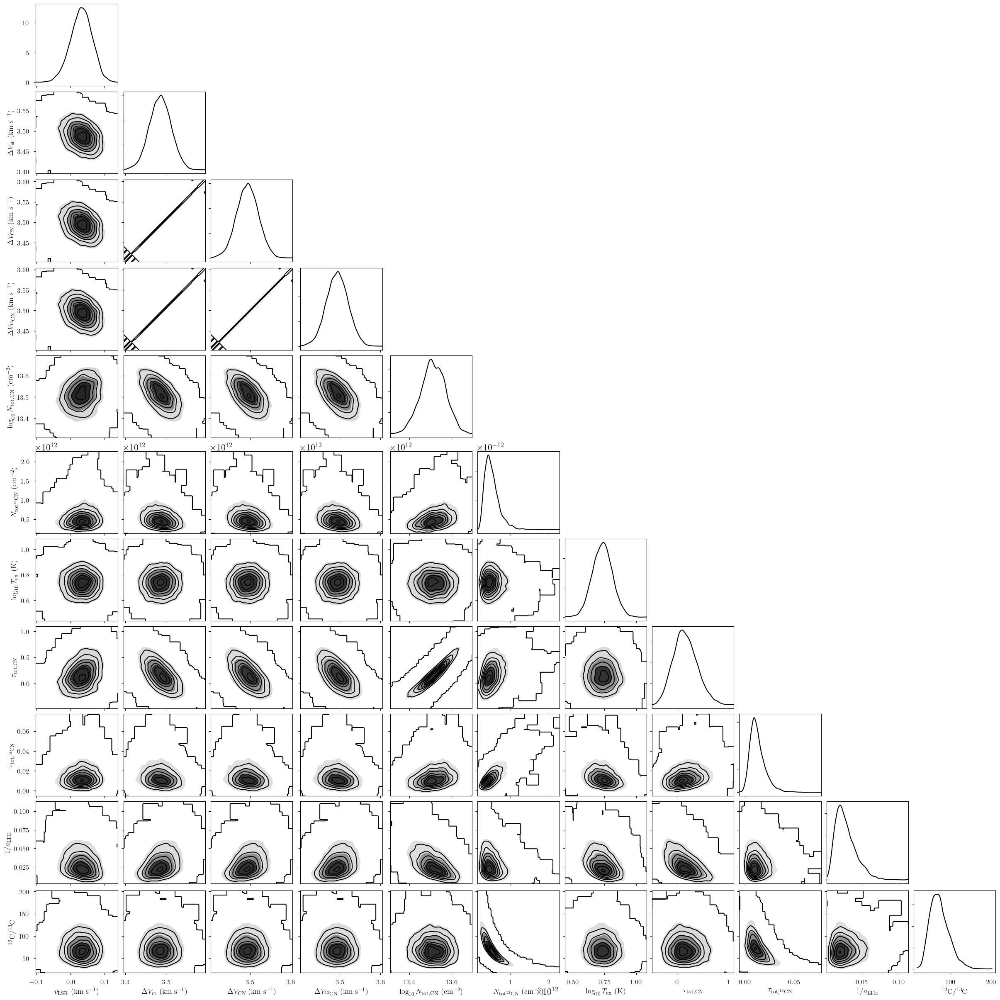

In [17]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + model.hyper_deterministics + ["LTE_precision", "ratio_12C_13C"], # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)

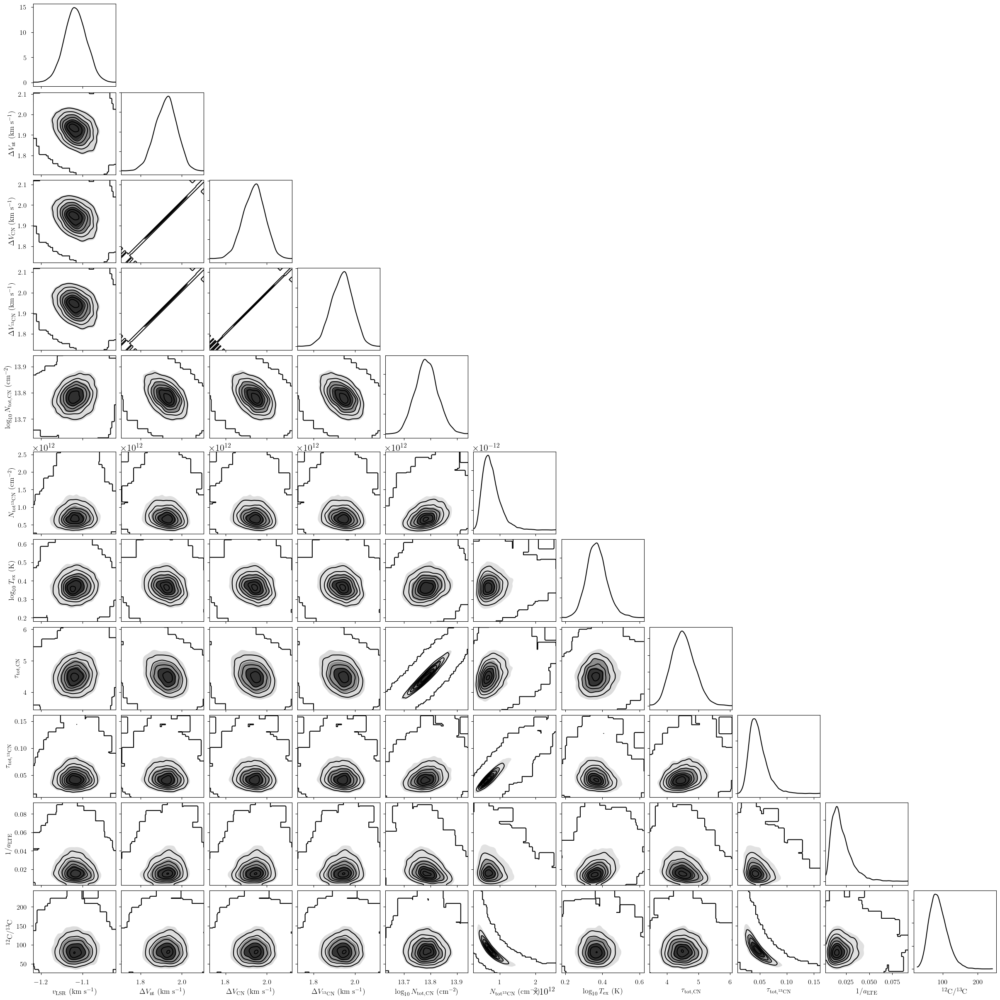

In [18]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1), # samples
    var_names + model.hyper_deterministics + ["LTE_precision", "ratio_12C_13C"], # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)

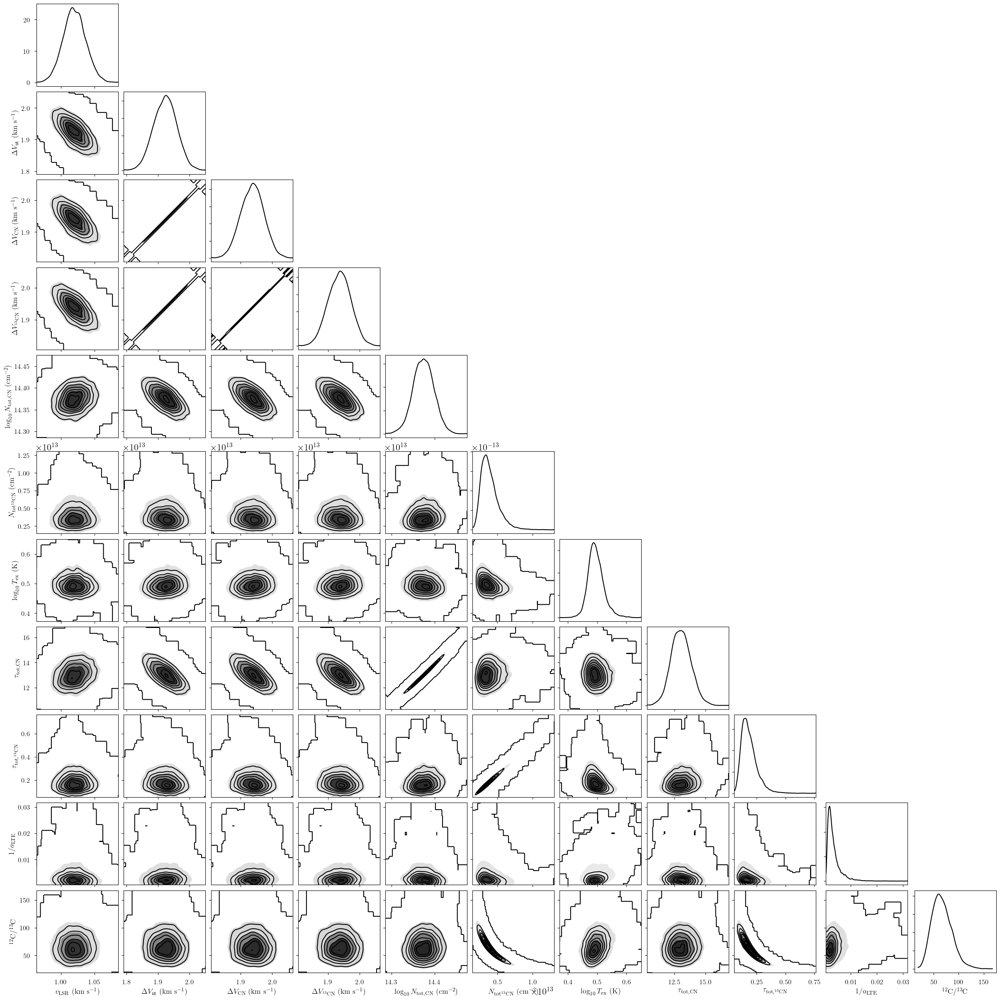

In [19]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2), # samples
    var_names + model.hyper_deterministics + ["LTE_precision", "ratio_12C_13C"], # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)

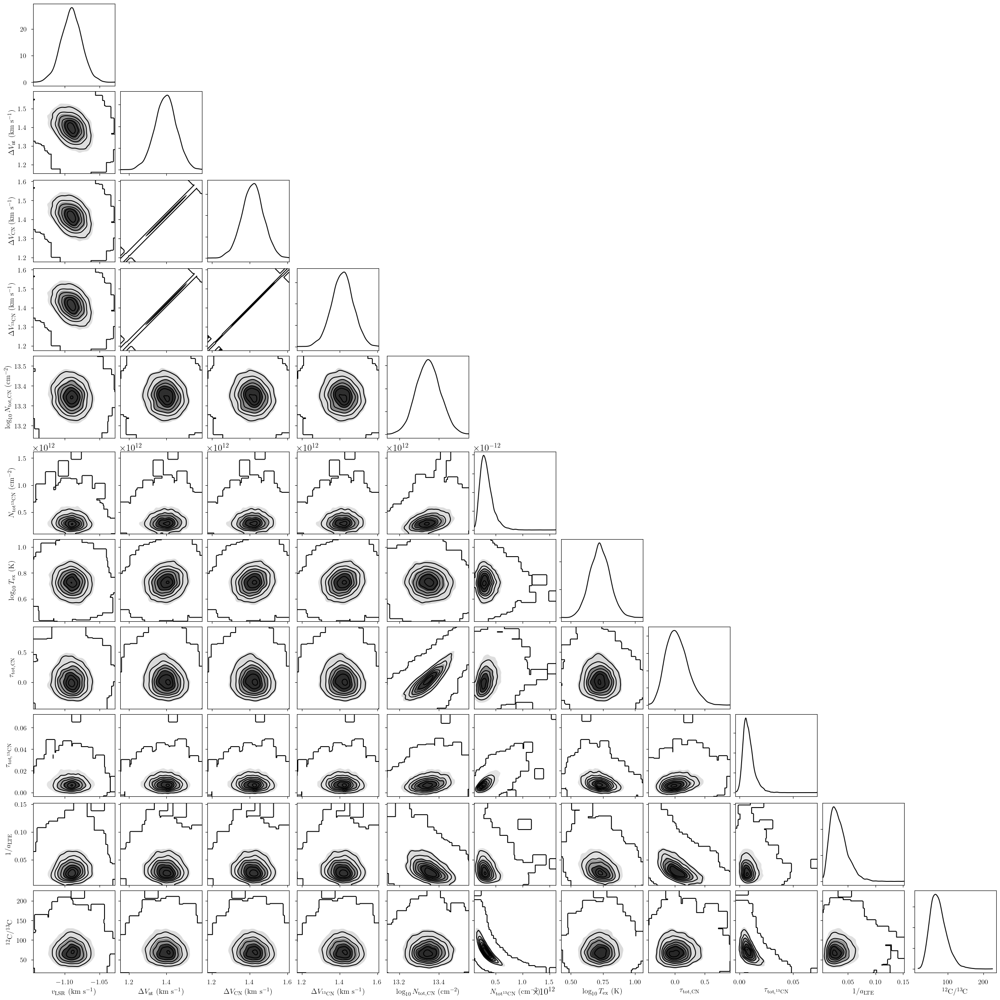

In [20]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=3), # samples
    var_names + model.hyper_deterministics + ["LTE_precision", "ratio_12C_13C"], # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)

## Assumption about 13CN Excitation Temperature
There is no evidence for CTEX in the 13CN data, and we are unable to constrain the excitation temperature of 13CN because we only detect the brightest transitions. Here we relax the 13CN CTEX assumption and instead assume that it suffers from hyperfine anomalies the same as 12CN.

In [25]:
from bayes_cn_hfs.cn_ratio_model import CNRatioModel

# Initialize and define the model
n_clouds = 4 # number of cloud components
baseline_degree = 0 # polynomial baseline degree
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N_12CN = [13.5, 1.0], # mean and width of log10 12CN total column density prior (cm-2)
    prior_ratio_12C_13C = [75.0, 25.0], # mean and width of 12C/13C ratio prior
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [0.5, 0.1], # mean and width of excitation temperature prior (K)
    assume_CTEX_12CN = False, # do not assume CTEX
    prior_LTE_precision = 100.0, # width of LTE precision prior
    assume_CTEX_13CN = False, # do not assume CTEX for 13CN
    fix_log10_Tkin = 1.5, # kinetic temperature is fixed (K)
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, 13CN, LTE_precision, baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, log10_Tex_ul_norm, ratio_12C_13C, velocity_norm, weights_12CN, weights_13CN]


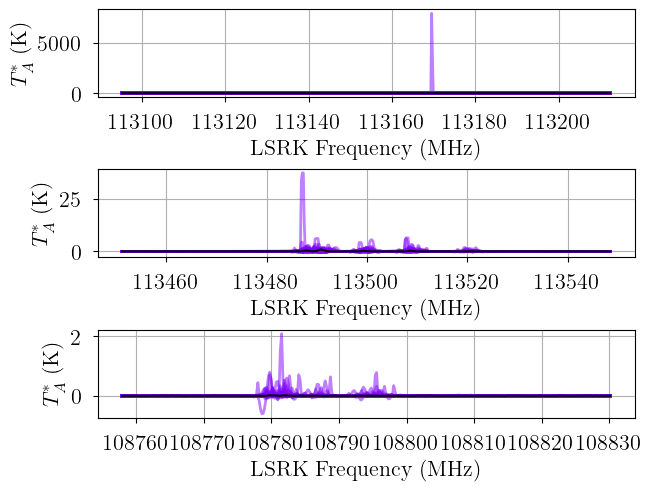

In [26]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=100,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [27]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.01, # VI relative convergence threshold
    abs_tolerance = 0.12, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 7000
Interrupted at 6,999 [6%]: Average Loss = 1.2795e+23


Output()

Runtime: 0.57 minutes


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

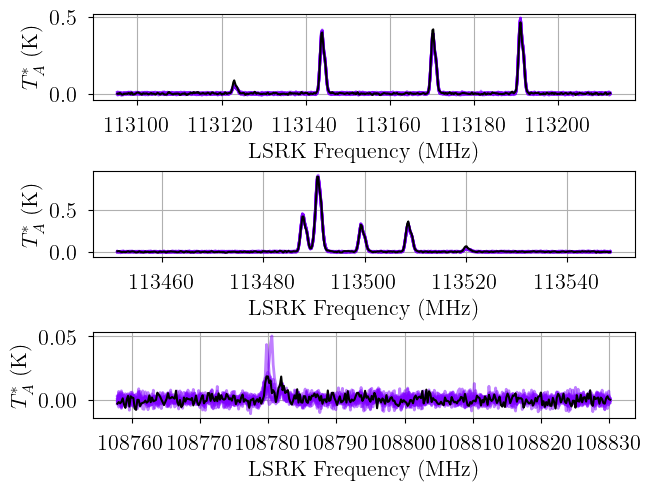

In [28]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [29]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.01,
    "abs_tolerance": 0.12,
    "learning_rate": 0.02,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.8}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 13500
Interrupted at 13,499 [13%]: Average Loss = 3.7341e+19
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, ratio_12C_13C, log10_Tex_ul_norm, LTE_precision, weights_12CN, weights_13CN]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 7907 seconds.


Adding log-likelihood to trace


Output()

There were 275 divergences in converged chains.
Runtime: 133.00 minutes


In [30]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution
7 of 8 chains appear converged.


In [31]:
print("solutions:", model.solutions)

pm.summary(model.trace.solution_0)

solutions: [0]


/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],-5.000000e-02,4.200000e-02,-1.290000e-01,3.100000e-02,0.000000e+00,1.000000e-03,12473.0,4854.0,1.00
baseline_12CN-2_norm[0],-2.650000e-01,4.900000e-02,-3.580000e-01,-1.760000e-01,0.000000e+00,1.000000e-03,11433.0,4824.0,1.00
baseline_13CN_norm[0],-7.400000e-02,5.600000e-02,-1.820000e-01,2.900000e-02,1.000000e-03,1.000000e-03,12124.0,4449.0,1.00
velocity_norm[0],1.000000e-02,1.100000e-02,-9.000000e-03,3.100000e-02,0.000000e+00,0.000000e+00,3676.0,4606.0,1.00
velocity_norm[1],-3.720000e-01,9.000000e-03,-3.890000e-01,-3.550000e-01,0.000000e+00,0.000000e+00,3822.0,5053.0,1.00
velocity_norm[2],3.400000e-01,6.000000e-03,3.300000e-01,3.500000e-01,0.000000e+00,0.000000e+00,4564.0,4509.0,1.00
velocity_norm[3],-3.630000e-01,5.000000e-03,-3.720000e-01,-3.540000e-01,0.000000e+00,0.000000e+00,4332.0,4742.0,1.00
log10_N_12CN_norm[0],1.200000e-02,5.800000e-02,-9.500000e-02,1.210000e-01,2.000000e-03,1.000000e-03,1314.0,2209.0,1.00
log10_N_12CN_norm[1],2.850000e-01,4.300000e-02,1.990000e-01,3.590000e-01,1.000000e-03,0.000000e+00,2088.0,3804.0,1.00
log10_N_12CN_norm[2],8.740000e-01,2.400000e-02,8.320000e-01,9.220000e-01,1.000000e-03,0.000000e+00,2009.0,3120.0,1.00


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

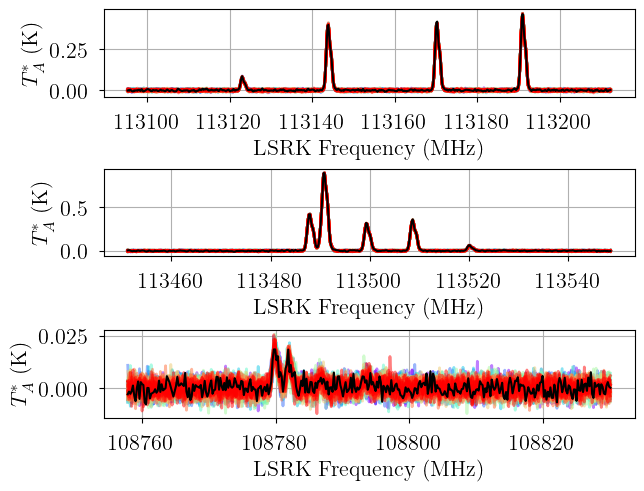

In [32]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [33]:
# 12C/13C ratio over all clouds
for solution in model.solutions:
    model.trace[f"solution_{solution}"]["ratio_12C_13C_total"] = (
        (10.0**model.trace[f"solution_{solution}"]["log10_N_12CN"]).sum(dim="cloud") / 
    model.trace[f"solution_{solution}"]["N_13CN"].sum(dim="cloud")
    )
    

In [34]:
pm.summary(model.trace.solution_0, var_names=["ratio_12C_13C_total"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ratio_12C_13C_total,67.441,14.305,41.092,94.142,0.2,0.155,5082.0,4542.0,1.0


The assumption about 13CN CTEX does not impact our inference significantly.